# A100 DnCNN V2: extended fine-tuning

공식 `cszn/KAIR`의 `dncnn_gray_blind.pth`를 시작점으로 사용해 반도체 grayscale 이미지에 fine-tuning합니다.

- 학습 및 모델 선택에는 `train`과 `val`만 사용합니다.
- 테스트 데이터는 best checkpoint가 확정된 다음 셀에서 처음 복사하고, 최종 평가에만 사용합니다.
- 원본 `train_denoising_example.ipynb`와 `test_denoising.ipynb`는 수정하지 않습니다.
- 데이터 복사, 학습, x8 최종 평가를 포함해 A100 런타임 1시간 이내를 목표로 합니다.


## 1. Colab 및 프로젝트 경로 설정


In [45]:
import time

NOTEBOOK_STARTED_AT = time.monotonic()

from google.colab import drive
drive.mount("/content/drive")

import json
import math
import os
import random
import shutil
import sys
import time
import urllib.request
from datetime import datetime
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import Tensor, nn
from torch.nn import functional
from torch.utils.data import DataLoader
from tqdm.auto import tqdm

# 원본 예제 노트북과 동일한 기본 경로입니다. Drive 위치가 다르면 이 한 줄만 바꾸세요.
ROOT = Path("/content/drive/MyDrive/Data scientist/팀프로젝트/5주차")
CODE_DIR = ROOT / "code_denoising"
DATA_ROOT = ROOT / "dataset"
MODULE_PATH = CODE_DIR / "a100_denoising.py"

if not MODULE_PATH.exists():
    raise FileNotFoundError(
        f"{MODULE_PATH}가 없습니다. ROOT를 현재 프로젝트 폴더로 수정하세요."
    )

sys.path.insert(0, str(CODE_DIR))
from a100_denoising import (
    CleanDenoisingDataset,
    DataKey,
    DnCNN,
    ExponentialMovingAverage,
    NOISE_RANGES,
    PairedDenoisingDataset,
    TestTimeDenoiser,
    TimeBudget,
    calculate_psnr,
    calculate_ssim,
    discover_clean_files,
    evaluate_model,
    load_finetuned_checkpoint,
    load_pretrained_weights,
    save_checkpoint,
    train_one_epoch,
    validate_disjoint_splits,
)

print("project:", ROOT)
print("torch:", torch.__version__)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
project: /content/drive/MyDrive/Data scientist/팀프로젝트/5주차
torch: 2.11.0+cu128


In [46]:
if not torch.cuda.is_available():
    raise RuntimeError("GPU 런타임이 아닙니다. Colab 런타임을 A100 GPU로 변경하세요.")

device = torch.device("cuda")
gpu_name = torch.cuda.get_device_name(0)
print("GPU:", gpu_name)
if "A100" not in gpu_name.upper():
    print("경고: A100이 아닙니다. 시간 제한을 위해 batch size를 낮춰야 할 수 있습니다.")

torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
torch.set_float32_matmul_precision("high")

SEED = 2026
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

RUN_ID = datetime.now().strftime("%Y%m%d-%H%M%S")
TEST_RUN_DIR = ROOT / "logs_denoising_a100" / RUN_ID
TEST_RUN_DIR.mkdir(parents=True, exist_ok=True)
print("run dir:", TEST_RUN_DIR)


GPU: NVIDIA A100-SXM4-80GB
run dir: /content/drive/MyDrive/Data scientist/팀프로젝트/5주차/logs_denoising_a100/20260831-073126


## 2. train/val만 `/content`로 복사

이 단계에서는 테스트 디렉터리를 읽거나 복사하지 않습니다. Google Drive I/O가 학습 병목이 되지 않도록 clean train/val만 로컬 SSD로 복사합니다.


In [47]:
import zipfile
from pathlib import PurePosixPath

LOCAL_DATA_ROOT = Path("/content/denoising_dataset")
LOCAL_TRAIN_DIR = LOCAL_DATA_ROOT / "train"
LOCAL_VAL_DIR = LOCAL_DATA_ROOT / "val"
LOCAL_ARCHIVE = Path("/content/dataset.zip")

archive_candidates = [
    ROOT / "dataset.zip",
    DATA_ROOT / "dataset.zip",
]
ARCHIVE_SOURCE = next(
    (path for path in archive_candidates if path.exists()),
    None,
)

if ARCHIVE_SOURCE is None:
    raise FileNotFoundError(
        f"dataset.zip을 찾을 수 없습니다: {archive_candidates}"
    )


def copy_archive_with_progress(source: Path, destination: Path) -> None:
    if (
        destination.exists()
        and destination.stat().st_size == source.stat().st_size
    ):
        print("로컬 ZIP 재사용:", destination)
        return

    temporary = destination.with_suffix(".zip.part")
    temporary.unlink(missing_ok=True)

    chunk_size = 16 * 1024 * 1024
    total_size = source.stat().st_size

    with (
        source.open("rb") as source_file,
        temporary.open("wb") as destination_file,
        tqdm(
            total=total_size,
            unit="B",
            unit_scale=True,
            desc="dataset.zip 복사",
        ) as progress,
    ):
        while True:
            chunk = source_file.read(chunk_size)
            if not chunk:
                break
            destination_file.write(chunk)
            progress.update(len(chunk))

    temporary.replace(destination)

    if destination.stat().st_size != total_size:
        raise IOError("dataset.zip 복사가 완전하지 않습니다.")


def extract_selected_splits(
    archive_path: Path,
    destination_root: Path,
    splits: tuple[str, ...],
) -> None:
    for split in splits:
        destination = destination_root / split
        if destination.exists():
            shutil.rmtree(destination)
        destination.mkdir(parents=True, exist_ok=True)

    with zipfile.ZipFile(archive_path) as archive:
        selected = []

        for info in archive.infolist():
            if info.is_dir():
                continue

            normalized = info.filename.replace("\\", "/")
            parts = PurePosixPath(normalized).parts

            if ".." in parts:
                raise ValueError(f"안전하지 않은 ZIP 경로: {info.filename}")

            matched_split = next(
                (split for split in splits if split in parts),
                None,
            )
            if matched_split is None:
                continue

            split_index = parts.index(matched_split)
            relative_parts = list(parts[split_index + 1 :])

            while (
                relative_parts
                and relative_parts[0] == matched_split
            ):
                relative_parts.pop(0)

            if not relative_parts:
                continue
            if Path(relative_parts[-1]).suffix.lower() != ".npy":
                continue

            selected.append(
                (info, matched_split, relative_parts)
            )

        if not selected:
            raise FileNotFoundError(
                f"ZIP에서 {splits} split을 찾지 못했습니다."
            )

        for info, split, relative_parts in tqdm(
            selected,
            desc="train/val 압축 해제",
        ):
            output_path = (
                destination_root
                / split
                / Path(*relative_parts)
            )
            output_path.parent.mkdir(parents=True, exist_ok=True)

            with (
                archive.open(info) as source_file,
                output_path.open("wb") as output_file,
            ):
                shutil.copyfileobj(
                    source_file,
                    output_file,
                    length=16 * 1024 * 1024,
                )


# freeze 이후 test 데이터 100장을 복사할 때 기존 셀이 사용합니다.
def copy_split(source: Path, destination: Path) -> None:
    source_files = sorted(source.glob("*.npy"))
    if not source_files:
        raise FileNotFoundError(f"데이터가 없습니다: {source}")

    if destination.exists():
        shutil.rmtree(destination)

    shutil.copytree(source, destination)
    print(f"{source.name}: {len(source_files)} files -> {destination}")


copy_archive_with_progress(ARCHIVE_SOURCE, LOCAL_ARCHIVE)

# 학습 전에는 train과 val만 압축 해제합니다.
extract_selected_splits(
    LOCAL_ARCHIVE,
    LOCAL_DATA_ROOT,
    ("train", "val"),
)

print("train:", len(list(LOCAL_TRAIN_DIR.glob("*.npy"))))
print("val:", len(list(LOCAL_VAL_DIR.glob("*.npy"))))

로컬 ZIP 재사용: /content/dataset.zip


train/val 압축 해제:   0%|          | 0/7368 [00:00<?, ?it/s]

train: 7268
val: 100


In [48]:
TRAIN_BATCH = 64
PATCH_SIZE = 128
NUM_WORKERS = min(8, os.cpu_count() or 2)

train_files = discover_clean_files([LOCAL_TRAIN_DIR])
validation_files = discover_clean_files([LOCAL_VAL_DIR])
validate_disjoint_splits(train_files, validation_files)

train_dataset = CleanDenoisingDataset(
    train_files,
    patch_size=PATCH_SIZE,
    training=True,
    base_seed=SEED,
    identity_probability=0.08,
)
validation_dataset = CleanDenoisingDataset(
    validation_files,
    patch_size=None,
    training=False,
    base_seed=SEED,
)

train_loader = DataLoader(
    train_dataset,
    batch_size=TRAIN_BATCH,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=NUM_WORKERS > 0,
    prefetch_factor=4 if NUM_WORKERS > 0 else None,
)
validation_loader = DataLoader(
    validation_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=min(4, NUM_WORKERS),
    pin_memory=True,
    persistent_workers=NUM_WORKERS > 0,
)

print("train:", len(train_dataset), "validation:", len(validation_dataset))
print("steps per epoch:", len(train_loader))

# 여러 고정 validation noise seed의 평균으로 checkpoint를 선택합니다.
VALIDATION_REPEATS = 3
validation_datasets = []
validation_loaders = []
for repeat in range(VALIDATION_REPEATS):
    repeat_dataset = CleanDenoisingDataset(
        validation_files,
        patch_size=None,
        training=False,
        base_seed=SEED + 10000 * (repeat + 1),
    )
    repeat_loader = DataLoader(
        repeat_dataset,
        batch_size=8,
        shuffle=False,
        num_workers=min(4, NUM_WORKERS),
        pin_memory=True,
        persistent_workers=NUM_WORKERS > 0,
    )
    validation_datasets.append(repeat_dataset)
    validation_loaders.append(repeat_loader)
print("validation repeats:", len(validation_loaders))



train: 7268 validation: 100
steps per epoch: 113
validation repeats: 3


## 3. 공식 pretrained grayscale-blind DnCNN 로드


In [49]:
PRETRAINED_URL = (
    "https://github.com/cszn/KAIR/releases/download/v1.0/"
    "dncnn_gray_blind.pth"
)
PRETRAINED_PATH = Path("/content/dncnn_gray_blind.pth")
MODEL_CONFIG = {"depth": 20, "channels": 1, "features": 64}

if not PRETRAINED_PATH.exists() or PRETRAINED_PATH.stat().st_size < 2_000_000:
    print("Downloading official dncnn_gray_blind.pth ...")
    urllib.request.urlretrieve(PRETRAINED_URL, PRETRAINED_PATH)

model = DnCNN(**MODEL_CONFIG)
load_pretrained_weights(model, PRETRAINED_PATH)
model = model.to(device=device, memory_format=torch.channels_last)

with torch.no_grad():
    sanity = model(torch.rand(1, 1, 32, 32, device=device))
assert sanity.shape == (1, 1, 32, 32) and torch.isfinite(sanity).all()
print("pretrained strict load OK | params:", sum(p.numel() for p in model.parameters()))


pretrained strict load OK | params: 665921


## 4. Fine-tuning

- 공식 pretrained weight에서 모든 layer를 fine-tuning합니다.
- MSE를 중심으로 작은 SSIM 항을 더해 PSNR과 구조 보존을 함께 최적화합니다.
- EMA weight와 validation PSNR로 best checkpoint를 결정합니다.
- 학습 시간은 45분에서 중단하여 checkpoint 저장과 최종 평가 시간을 남깁니다.


In [50]:
MAX_EPOCHS = 160
MIN_EPOCHS = 40
EARLY_STOP_PATIENCE = 25
MAX_TOTAL_MINUTES = 55.0
FINAL_RESERVE_MINUTES = 8.0
SSIM_WEIGHT = 0.02
MAX_LR = 1.5e-4

optimizer = torch.optim.AdamW(
    model.parameters(), lr=MAX_LR / 10.0, betas=(0.9, 0.99), weight_decay=1e-6
)
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=MAX_LR,
    total_steps=MAX_EPOCHS * len(train_loader),
    pct_start=0.1,
    anneal_strategy="cos",
    div_factor=10.0,
    final_div_factor=100.0,
)
try:
    scaler = torch.amp.GradScaler("cuda", enabled=True)
except TypeError:
    scaler = torch.cuda.amp.GradScaler(enabled=True)

ema = ExponentialMovingAverage(model, decay=0.999)
BEST_CHECKPOINT = TEST_RUN_DIR / "checkpoint_best_a100_v2.ckpt"
HISTORY_PATH = TEST_RUN_DIR / "training_history_v2.json"

best_psnr = -math.inf
bad_epochs = 0
history = []
budget = TimeBudget(
    MAX_TOTAL_MINUTES,
    FINAL_RESERVE_MINUTES,
    NOTEBOOK_STARTED_AT,
)


In [51]:
for epoch in range(1, MAX_EPOCHS + 1):
    training_deadline = (
        budget.start_time
        + (budget.max_minutes - budget.reserve_minutes) * 60.0
    )
    expected_epoch_seconds = (
        max(record["seconds"] for record in history) * 1.25
        if history
        else 0.0
    )
    if budget.expired() or (
        expected_epoch_seconds > 0
        and time.monotonic() + expected_epoch_seconds >= training_deadline
    ):
        print("final evaluation reserve reached; training stops before a new epoch")
        break

    epoch_start = time.monotonic()
    train_loss = train_one_epoch(
        model,
        tqdm(train_loader, desc=f"train {epoch:02d}", leave=False),
        optimizer,
        device=device,
        ssim_weight=SSIM_WEIGHT,
        scaler=scaler,
        scheduler=scheduler,
        ema=ema,
        gradient_clip=1.0,
    )
    validation_scores = []
    for repeat, repeat_loader in enumerate(validation_loaders, start=1):
        repeat_psnr, repeat_ssim = evaluate_model(
            ema.model,
            tqdm(repeat_loader, desc=f"valid {epoch:02d}/{repeat}", leave=False),
            device,
            clamp=True,
        )
        validation_scores.append((repeat_psnr, repeat_ssim))
    val_psnr = float(np.mean([score[0] for score in validation_scores]))
    val_ssim = float(np.mean([score[1] for score in validation_scores]))
    elapsed = time.monotonic() - epoch_start
    record = {
        "epoch": epoch,
        "train_loss": train_loss,
        "val_psnr": val_psnr,
        "val_ssim": val_ssim,
        "lr": optimizer.param_groups[0]["lr"],
        "seconds": elapsed,
    }
    history.append(record)
    HISTORY_PATH.write_text(json.dumps(history, indent=2), encoding="utf-8")
    print(
        f"epoch {epoch:02d} | loss {train_loss:.5f} | "
        f"val PSNR {val_psnr:.3f} | SSIM {val_ssim:.4f} | {elapsed:.1f}s"
    )

    if val_psnr > best_psnr:
        best_psnr = val_psnr
        bad_epochs = 0
        save_checkpoint(
            BEST_CHECKPOINT,
            ema.model,
            MODEL_CONFIG,
            epoch=epoch,
            val_psnr=val_psnr,
            val_ssim=val_ssim,
        )
        print("  best checkpoint updated")
    else:
        bad_epochs += 1

    if budget.expired():
        print("시간 제한에 도달하여 학습을 종료합니다.")
        break
    if epoch >= MIN_EPOCHS and bad_epochs >= EARLY_STOP_PATIENCE:
        print("validation PSNR early stopping")
        break

if not BEST_CHECKPOINT.exists():
    raise RuntimeError("best checkpoint가 생성되지 않았습니다.")
print("best checkpoint:", BEST_CHECKPOINT)


train 01:   0%|          | 0/113 [00:00<?, ?it/s]

valid 01/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 01/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 01/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 01 | loss 0.00489 | val PSNR 28.702 | SSIM 0.7605 | 8.2s
  best checkpoint updated


train 02:   0%|          | 0/113 [00:00<?, ?it/s]

valid 02/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 02/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 02/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 02 | loss 0.00417 | val PSNR 28.892 | SSIM 0.7722 | 7.5s
  best checkpoint updated


train 03:   0%|          | 0/113 [00:00<?, ?it/s]

valid 03/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 03/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 03/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 03 | loss 0.00388 | val PSNR 29.118 | SSIM 0.7837 | 7.5s
  best checkpoint updated


train 04:   0%|          | 0/113 [00:00<?, ?it/s]

valid 04/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 04/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 04/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 04 | loss 0.00386 | val PSNR 29.352 | SSIM 0.7937 | 7.5s
  best checkpoint updated


train 05:   0%|          | 0/113 [00:00<?, ?it/s]

valid 05/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 05/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 05/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 05 | loss 0.00360 | val PSNR 29.574 | SSIM 0.8028 | 7.6s
  best checkpoint updated


train 06:   0%|          | 0/113 [00:00<?, ?it/s]

valid 06/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 06/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 06/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 06 | loss 0.00352 | val PSNR 29.783 | SSIM 0.8114 | 7.6s
  best checkpoint updated


train 07:   0%|          | 0/113 [00:00<?, ?it/s]

valid 07/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 07/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 07/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 07 | loss 0.00339 | val PSNR 29.986 | SSIM 0.8199 | 7.6s
  best checkpoint updated


train 08:   0%|          | 0/113 [00:00<?, ?it/s]

valid 08/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 08/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 08/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 08 | loss 0.00331 | val PSNR 30.191 | SSIM 0.8285 | 7.6s
  best checkpoint updated


train 09:   0%|          | 0/113 [00:00<?, ?it/s]

valid 09/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 09/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 09/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 09 | loss 0.00341 | val PSNR 30.365 | SSIM 0.8369 | 7.6s
  best checkpoint updated


train 10:   0%|          | 0/113 [00:00<?, ?it/s]

valid 10/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 10/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 10/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 10 | loss 0.00331 | val PSNR 30.553 | SSIM 0.8451 | 7.6s
  best checkpoint updated


train 11:   0%|          | 0/113 [00:00<?, ?it/s]

valid 11/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 11/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 11/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 11 | loss 0.00356 | val PSNR 30.754 | SSIM 0.8526 | 7.6s
  best checkpoint updated


train 12:   0%|          | 0/113 [00:00<?, ?it/s]

valid 12/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 12/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 12/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 12 | loss 0.00336 | val PSNR 30.923 | SSIM 0.8597 | 7.6s
  best checkpoint updated


train 13:   0%|          | 0/113 [00:00<?, ?it/s]

valid 13/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 13/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 13/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 13 | loss 0.00339 | val PSNR 31.053 | SSIM 0.8657 | 7.6s
  best checkpoint updated


train 14:   0%|          | 0/113 [00:00<?, ?it/s]

valid 14/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 14/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 14/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 14 | loss 0.00344 | val PSNR 31.148 | SSIM 0.8690 | 7.6s
  best checkpoint updated


train 15:   0%|          | 0/113 [00:00<?, ?it/s]

valid 15/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 15/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 15/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 15 | loss 0.00325 | val PSNR 31.256 | SSIM 0.8727 | 7.5s
  best checkpoint updated


train 16:   0%|          | 0/113 [00:00<?, ?it/s]

valid 16/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 16/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 16/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 16 | loss 0.00328 | val PSNR 31.370 | SSIM 0.8759 | 7.6s
  best checkpoint updated


train 17:   0%|          | 0/113 [00:00<?, ?it/s]

valid 17/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 17/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 17/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 17 | loss 0.00338 | val PSNR 31.413 | SSIM 0.8760 | 7.7s
  best checkpoint updated


train 18:   0%|          | 0/113 [00:00<?, ?it/s]

valid 18/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 18/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 18/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 18 | loss 0.00337 | val PSNR 31.505 | SSIM 0.8792 | 7.6s
  best checkpoint updated


train 19:   0%|          | 0/113 [00:00<?, ?it/s]

valid 19/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 19/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 19/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 19 | loss 0.00344 | val PSNR 31.548 | SSIM 0.8804 | 7.6s
  best checkpoint updated


train 20:   0%|          | 0/113 [00:00<?, ?it/s]

valid 20/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 20/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 20/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 20 | loss 0.00305 | val PSNR 31.668 | SSIM 0.8830 | 7.6s
  best checkpoint updated


train 21:   0%|          | 0/113 [00:00<?, ?it/s]

valid 21/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 21/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 21/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 21 | loss 0.00319 | val PSNR 31.778 | SSIM 0.8850 | 7.6s
  best checkpoint updated


train 22:   0%|          | 0/113 [00:00<?, ?it/s]

valid 22/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 22/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 22/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 22 | loss 0.00317 | val PSNR 31.887 | SSIM 0.8871 | 7.6s
  best checkpoint updated


train 23:   0%|          | 0/113 [00:00<?, ?it/s]

valid 23/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 23/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 23/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 23 | loss 0.00345 | val PSNR 31.757 | SSIM 0.8839 | 7.6s


train 24:   0%|          | 0/113 [00:00<?, ?it/s]

valid 24/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 24/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 24/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 24 | loss 0.00309 | val PSNR 31.840 | SSIM 0.8854 | 7.6s


train 25:   0%|          | 0/113 [00:00<?, ?it/s]

valid 25/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 25/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 25/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 25 | loss 0.00290 | val PSNR 31.983 | SSIM 0.8884 | 7.6s
  best checkpoint updated


train 26:   0%|          | 0/113 [00:00<?, ?it/s]

valid 26/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 26/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 26/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 26 | loss 0.00289 | val PSNR 32.132 | SSIM 0.8914 | 7.5s
  best checkpoint updated


train 27:   0%|          | 0/113 [00:00<?, ?it/s]

valid 27/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 27/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 27/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 27 | loss 0.00309 | val PSNR 32.238 | SSIM 0.8929 | 7.5s
  best checkpoint updated


train 28:   0%|          | 0/113 [00:00<?, ?it/s]

valid 28/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 28/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 28/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 28 | loss 0.00317 | val PSNR 32.340 | SSIM 0.8946 | 7.5s
  best checkpoint updated


train 29:   0%|          | 0/113 [00:00<?, ?it/s]

valid 29/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 29/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 29/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 29 | loss 0.00295 | val PSNR 32.432 | SSIM 0.8966 | 7.5s
  best checkpoint updated


train 30:   0%|          | 0/113 [00:00<?, ?it/s]

valid 30/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 30/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 30/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 30 | loss 0.00284 | val PSNR 32.526 | SSIM 0.8981 | 7.5s
  best checkpoint updated


train 31:   0%|          | 0/113 [00:00<?, ?it/s]

valid 31/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 31/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 31/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 31 | loss 0.00294 | val PSNR 32.620 | SSIM 0.8993 | 7.5s
  best checkpoint updated


train 32:   0%|          | 0/113 [00:00<?, ?it/s]

valid 32/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 32/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 32/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 32 | loss 0.00290 | val PSNR 32.716 | SSIM 0.9008 | 7.6s
  best checkpoint updated


train 33:   0%|          | 0/113 [00:00<?, ?it/s]

valid 33/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 33/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 33/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 33 | loss 0.00276 | val PSNR 32.820 | SSIM 0.9022 | 7.6s
  best checkpoint updated


train 34:   0%|          | 0/113 [00:00<?, ?it/s]

valid 34/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 34/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 34/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 34 | loss 0.00312 | val PSNR 32.915 | SSIM 0.9028 | 7.6s
  best checkpoint updated


train 35:   0%|          | 0/113 [00:00<?, ?it/s]

valid 35/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 35/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 35/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 35 | loss 0.00285 | val PSNR 32.918 | SSIM 0.8992 | 7.6s
  best checkpoint updated


train 36:   0%|          | 0/113 [00:00<?, ?it/s]

valid 36/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 36/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 36/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 36 | loss 0.00282 | val PSNR 32.937 | SSIM 0.8968 | 7.6s
  best checkpoint updated


train 37:   0%|          | 0/113 [00:00<?, ?it/s]

valid 37/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 37/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 37/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 37 | loss 0.00315 | val PSNR 32.991 | SSIM 0.9000 | 7.5s
  best checkpoint updated


train 38:   0%|          | 0/113 [00:00<?, ?it/s]

valid 38/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 38/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 38/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 38 | loss 0.00287 | val PSNR 33.027 | SSIM 0.9010 | 7.6s
  best checkpoint updated


train 39:   0%|          | 0/113 [00:00<?, ?it/s]

valid 39/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 39/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 39/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 39 | loss 0.00286 | val PSNR 33.042 | SSIM 0.9016 | 7.6s
  best checkpoint updated


train 40:   0%|          | 0/113 [00:00<?, ?it/s]

valid 40/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 40/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 40/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 40 | loss 0.00272 | val PSNR 33.111 | SSIM 0.9030 | 7.6s
  best checkpoint updated


train 41:   0%|          | 0/113 [00:00<?, ?it/s]

valid 41/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 41/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 41/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 41 | loss 0.00274 | val PSNR 33.170 | SSIM 0.9040 | 7.6s
  best checkpoint updated


train 42:   0%|          | 0/113 [00:00<?, ?it/s]

valid 42/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 42/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 42/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 42 | loss 0.00286 | val PSNR 33.221 | SSIM 0.9048 | 7.6s
  best checkpoint updated


train 43:   0%|          | 0/113 [00:00<?, ?it/s]

valid 43/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 43/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 43/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 43 | loss 0.00344 | val PSNR 33.207 | SSIM 0.9038 | 7.6s


train 44:   0%|          | 0/113 [00:00<?, ?it/s]

valid 44/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 44/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 44/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 44 | loss 0.00302 | val PSNR 33.220 | SSIM 0.9041 | 7.6s


train 45:   0%|          | 0/113 [00:00<?, ?it/s]

valid 45/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 45/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 45/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 45 | loss 0.00279 | val PSNR 33.274 | SSIM 0.9050 | 7.6s
  best checkpoint updated


train 46:   0%|          | 0/113 [00:00<?, ?it/s]

valid 46/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 46/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 46/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 46 | loss 0.00281 | val PSNR 33.316 | SSIM 0.9058 | 7.6s
  best checkpoint updated


train 47:   0%|          | 0/113 [00:00<?, ?it/s]

valid 47/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 47/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 47/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 47 | loss 0.00264 | val PSNR 33.371 | SSIM 0.9067 | 7.6s
  best checkpoint updated


train 48:   0%|          | 0/113 [00:00<?, ?it/s]

valid 48/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 48/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 48/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 48 | loss 0.00265 | val PSNR 33.417 | SSIM 0.9074 | 7.6s
  best checkpoint updated


train 49:   0%|          | 0/113 [00:00<?, ?it/s]

valid 49/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 49/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 49/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 49 | loss 0.00266 | val PSNR 33.468 | SSIM 0.9080 | 7.6s
  best checkpoint updated


train 50:   0%|          | 0/113 [00:00<?, ?it/s]

valid 50/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 50/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 50/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 50 | loss 0.00277 | val PSNR 33.513 | SSIM 0.9085 | 7.5s
  best checkpoint updated


train 51:   0%|          | 0/113 [00:00<?, ?it/s]

valid 51/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 51/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 51/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 51 | loss 0.00267 | val PSNR 33.562 | SSIM 0.9090 | 7.6s
  best checkpoint updated


train 52:   0%|          | 0/113 [00:00<?, ?it/s]

valid 52/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 52/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 52/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 52 | loss 0.00273 | val PSNR 33.614 | SSIM 0.9098 | 7.6s
  best checkpoint updated


train 53:   0%|          | 0/113 [00:00<?, ?it/s]

valid 53/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 53/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 53/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 53 | loss 0.00272 | val PSNR 33.644 | SSIM 0.9103 | 7.6s
  best checkpoint updated


train 54:   0%|          | 0/113 [00:00<?, ?it/s]

valid 54/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 54/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 54/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 54 | loss 0.00273 | val PSNR 33.681 | SSIM 0.9108 | 7.6s
  best checkpoint updated


train 55:   0%|          | 0/113 [00:00<?, ?it/s]

valid 55/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 55/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 55/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 55 | loss 0.00251 | val PSNR 33.722 | SSIM 0.9114 | 7.6s
  best checkpoint updated


train 56:   0%|          | 0/113 [00:00<?, ?it/s]

valid 56/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 56/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 56/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 56 | loss 0.00255 | val PSNR 33.761 | SSIM 0.9118 | 7.6s
  best checkpoint updated


train 57:   0%|          | 0/113 [00:00<?, ?it/s]

valid 57/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 57/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 57/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 57 | loss 0.00262 | val PSNR 33.797 | SSIM 0.9123 | 7.5s
  best checkpoint updated


train 58:   0%|          | 0/113 [00:00<?, ?it/s]

valid 58/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 58/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 58/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 58 | loss 0.00253 | val PSNR 33.835 | SSIM 0.9127 | 7.6s
  best checkpoint updated


train 59:   0%|          | 0/113 [00:00<?, ?it/s]

valid 59/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 59/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 59/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 59 | loss 0.00280 | val PSNR 33.831 | SSIM 0.9125 | 7.6s


train 60:   0%|          | 0/113 [00:00<?, ?it/s]

valid 60/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 60/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 60/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 60 | loss 0.00291 | val PSNR 33.845 | SSIM 0.9123 | 7.5s
  best checkpoint updated


train 61:   0%|          | 0/113 [00:00<?, ?it/s]

valid 61/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 61/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 61/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 61 | loss 0.00252 | val PSNR 33.867 | SSIM 0.9122 | 7.6s
  best checkpoint updated


train 62:   0%|          | 0/113 [00:00<?, ?it/s]

valid 62/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 62/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 62/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 62 | loss 0.00258 | val PSNR 33.892 | SSIM 0.9125 | 7.6s
  best checkpoint updated


train 63:   0%|          | 0/113 [00:00<?, ?it/s]

valid 63/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 63/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 63/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 63 | loss 0.00257 | val PSNR 33.922 | SSIM 0.9128 | 7.6s
  best checkpoint updated


train 64:   0%|          | 0/113 [00:00<?, ?it/s]

valid 64/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 64/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 64/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 64 | loss 0.00254 | val PSNR 33.950 | SSIM 0.9133 | 7.6s
  best checkpoint updated


train 65:   0%|          | 0/113 [00:00<?, ?it/s]

valid 65/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 65/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 65/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 65 | loss 0.00253 | val PSNR 33.977 | SSIM 0.9136 | 7.6s
  best checkpoint updated


train 66:   0%|          | 0/113 [00:00<?, ?it/s]

valid 66/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 66/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 66/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 66 | loss 0.00255 | val PSNR 34.003 | SSIM 0.9139 | 7.5s
  best checkpoint updated


train 67:   0%|          | 0/113 [00:00<?, ?it/s]

valid 67/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 67/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 67/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 67 | loss 0.00243 | val PSNR 34.029 | SSIM 0.9143 | 7.6s
  best checkpoint updated


train 68:   0%|          | 0/113 [00:00<?, ?it/s]

valid 68/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 68/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 68/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 68 | loss 0.00257 | val PSNR 34.036 | SSIM 0.9143 | 7.6s
  best checkpoint updated


train 69:   0%|          | 0/113 [00:00<?, ?it/s]

valid 69/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 69/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 69/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 69 | loss 0.00248 | val PSNR 34.059 | SSIM 0.9146 | 7.5s
  best checkpoint updated


train 70:   0%|          | 0/113 [00:00<?, ?it/s]

valid 70/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 70/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 70/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 70 | loss 0.00259 | val PSNR 34.053 | SSIM 0.9144 | 7.7s


train 71:   0%|          | 0/113 [00:00<?, ?it/s]

valid 71/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 71/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 71/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 71 | loss 0.00242 | val PSNR 34.067 | SSIM 0.9146 | 7.5s
  best checkpoint updated


train 72:   0%|          | 0/113 [00:00<?, ?it/s]

valid 72/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 72/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 72/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 72 | loss 0.00263 | val PSNR 34.081 | SSIM 0.9150 | 7.6s
  best checkpoint updated


train 73:   0%|          | 0/113 [00:00<?, ?it/s]

valid 73/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 73/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 73/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 73 | loss 0.00247 | val PSNR 34.095 | SSIM 0.9152 | 7.6s
  best checkpoint updated


train 74:   0%|          | 0/113 [00:00<?, ?it/s]

valid 74/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 74/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 74/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 74 | loss 0.00240 | val PSNR 34.120 | SSIM 0.9156 | 7.6s
  best checkpoint updated


train 75:   0%|          | 0/113 [00:00<?, ?it/s]

valid 75/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 75/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 75/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 75 | loss 0.00245 | val PSNR 34.140 | SSIM 0.9158 | 7.6s
  best checkpoint updated


train 76:   0%|          | 0/113 [00:00<?, ?it/s]

valid 76/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 76/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 76/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 76 | loss 0.00249 | val PSNR 34.167 | SSIM 0.9161 | 7.5s
  best checkpoint updated


train 77:   0%|          | 0/113 [00:00<?, ?it/s]

valid 77/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 77/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 77/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 77 | loss 0.00243 | val PSNR 34.191 | SSIM 0.9163 | 7.6s
  best checkpoint updated


train 78:   0%|          | 0/113 [00:00<?, ?it/s]

valid 78/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 78/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 78/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 78 | loss 0.00245 | val PSNR 34.217 | SSIM 0.9166 | 7.6s
  best checkpoint updated


train 79:   0%|          | 0/113 [00:00<?, ?it/s]

valid 79/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 79/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 79/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 79 | loss 0.00247 | val PSNR 34.229 | SSIM 0.9168 | 7.6s
  best checkpoint updated


train 80:   0%|          | 0/113 [00:00<?, ?it/s]

valid 80/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 80/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 80/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 80 | loss 0.00241 | val PSNR 34.249 | SSIM 0.9170 | 7.6s
  best checkpoint updated


train 81:   0%|          | 0/113 [00:00<?, ?it/s]

valid 81/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 81/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 81/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 81 | loss 0.00242 | val PSNR 34.271 | SSIM 0.9172 | 7.6s
  best checkpoint updated


train 82:   0%|          | 0/113 [00:00<?, ?it/s]

valid 82/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 82/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 82/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 82 | loss 0.00240 | val PSNR 34.290 | SSIM 0.9175 | 7.6s
  best checkpoint updated


train 83:   0%|          | 0/113 [00:00<?, ?it/s]

valid 83/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 83/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 83/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 83 | loss 0.00239 | val PSNR 34.302 | SSIM 0.9176 | 7.5s
  best checkpoint updated


train 84:   0%|          | 0/113 [00:00<?, ?it/s]

valid 84/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 84/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 84/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 84 | loss 0.00245 | val PSNR 34.310 | SSIM 0.9178 | 7.7s
  best checkpoint updated


train 85:   0%|          | 0/113 [00:00<?, ?it/s]

valid 85/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 85/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 85/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 85 | loss 0.00238 | val PSNR 34.322 | SSIM 0.9179 | 7.5s
  best checkpoint updated


train 86:   0%|          | 0/113 [00:00<?, ?it/s]

valid 86/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 86/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 86/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 86 | loss 0.00236 | val PSNR 34.337 | SSIM 0.9181 | 7.5s
  best checkpoint updated


train 87:   0%|          | 0/113 [00:00<?, ?it/s]

valid 87/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 87/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 87/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 87 | loss 0.00239 | val PSNR 34.355 | SSIM 0.9183 | 7.6s
  best checkpoint updated


train 88:   0%|          | 0/113 [00:00<?, ?it/s]

valid 88/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 88/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 88/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 88 | loss 0.00233 | val PSNR 34.372 | SSIM 0.9185 | 7.6s
  best checkpoint updated


train 89:   0%|          | 0/113 [00:00<?, ?it/s]

valid 89/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 89/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 89/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 89 | loss 0.00237 | val PSNR 34.385 | SSIM 0.9186 | 7.6s
  best checkpoint updated


train 90:   0%|          | 0/113 [00:00<?, ?it/s]

valid 90/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 90/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 90/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 90 | loss 0.00240 | val PSNR 34.399 | SSIM 0.9187 | 7.6s
  best checkpoint updated


train 91:   0%|          | 0/113 [00:00<?, ?it/s]

valid 91/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 91/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 91/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 91 | loss 0.00237 | val PSNR 34.412 | SSIM 0.9189 | 7.6s
  best checkpoint updated


train 92:   0%|          | 0/113 [00:00<?, ?it/s]

valid 92/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 92/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 92/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 92 | loss 0.00239 | val PSNR 34.420 | SSIM 0.9190 | 7.6s
  best checkpoint updated


train 93:   0%|          | 0/113 [00:00<?, ?it/s]

valid 93/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 93/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 93/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 93 | loss 0.00234 | val PSNR 34.432 | SSIM 0.9191 | 7.6s
  best checkpoint updated


train 94:   0%|          | 0/113 [00:00<?, ?it/s]

valid 94/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 94/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 94/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 94 | loss 0.00236 | val PSNR 34.443 | SSIM 0.9192 | 7.6s
  best checkpoint updated


train 95:   0%|          | 0/113 [00:00<?, ?it/s]

valid 95/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 95/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 95/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 95 | loss 0.00230 | val PSNR 34.458 | SSIM 0.9194 | 7.6s
  best checkpoint updated


train 96:   0%|          | 0/113 [00:00<?, ?it/s]

valid 96/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 96/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 96/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 96 | loss 0.00230 | val PSNR 34.471 | SSIM 0.9195 | 7.6s
  best checkpoint updated


train 97:   0%|          | 0/113 [00:00<?, ?it/s]

valid 97/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 97/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 97/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 97 | loss 0.00227 | val PSNR 34.483 | SSIM 0.9197 | 7.6s
  best checkpoint updated


train 98:   0%|          | 0/113 [00:00<?, ?it/s]

valid 98/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 98/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 98/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 98 | loss 0.00230 | val PSNR 34.494 | SSIM 0.9198 | 7.5s
  best checkpoint updated


train 99:   0%|          | 0/113 [00:00<?, ?it/s]

valid 99/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 99/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 99/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 99 | loss 0.00230 | val PSNR 34.506 | SSIM 0.9200 | 7.6s
  best checkpoint updated


train 100:   0%|          | 0/113 [00:00<?, ?it/s]

valid 100/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 100/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 100/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 100 | loss 0.00226 | val PSNR 34.516 | SSIM 0.9201 | 7.5s
  best checkpoint updated


train 101:   0%|          | 0/113 [00:00<?, ?it/s]

valid 101/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 101/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 101/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 101 | loss 0.00225 | val PSNR 34.526 | SSIM 0.9202 | 7.6s
  best checkpoint updated


train 102:   0%|          | 0/113 [00:00<?, ?it/s]

valid 102/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 102/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 102/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 102 | loss 0.00230 | val PSNR 34.536 | SSIM 0.9203 | 7.6s
  best checkpoint updated


train 103:   0%|          | 0/113 [00:00<?, ?it/s]

valid 103/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 103/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 103/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 103 | loss 0.00226 | val PSNR 34.545 | SSIM 0.9204 | 7.6s
  best checkpoint updated


train 104:   0%|          | 0/113 [00:00<?, ?it/s]

valid 104/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 104/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 104/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 104 | loss 0.00228 | val PSNR 34.553 | SSIM 0.9205 | 7.6s
  best checkpoint updated


train 105:   0%|          | 0/113 [00:00<?, ?it/s]

valid 105/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 105/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 105/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 105 | loss 0.00231 | val PSNR 34.565 | SSIM 0.9206 | 7.6s
  best checkpoint updated


train 106:   0%|          | 0/113 [00:00<?, ?it/s]

valid 106/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 106/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 106/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 106 | loss 0.00229 | val PSNR 34.574 | SSIM 0.9207 | 7.5s
  best checkpoint updated


train 107:   0%|          | 0/113 [00:00<?, ?it/s]

valid 107/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 107/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 107/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 107 | loss 0.00226 | val PSNR 34.582 | SSIM 0.9208 | 7.6s
  best checkpoint updated


train 108:   0%|          | 0/113 [00:00<?, ?it/s]

valid 108/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 108/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 108/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 108 | loss 0.00228 | val PSNR 34.588 | SSIM 0.9208 | 7.6s
  best checkpoint updated


train 109:   0%|          | 0/113 [00:00<?, ?it/s]

valid 109/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 109/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 109/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 109 | loss 0.00223 | val PSNR 34.594 | SSIM 0.9209 | 7.6s
  best checkpoint updated


train 110:   0%|          | 0/113 [00:00<?, ?it/s]

valid 110/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 110/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 110/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 110 | loss 0.00234 | val PSNR 34.598 | SSIM 0.9210 | 7.6s
  best checkpoint updated


train 111:   0%|          | 0/113 [00:00<?, ?it/s]

valid 111/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 111/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 111/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 111 | loss 0.00229 | val PSNR 34.606 | SSIM 0.9211 | 7.6s
  best checkpoint updated


train 112:   0%|          | 0/113 [00:00<?, ?it/s]

valid 112/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 112/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 112/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 112 | loss 0.00228 | val PSNR 34.614 | SSIM 0.9211 | 7.6s
  best checkpoint updated


train 113:   0%|          | 0/113 [00:00<?, ?it/s]

valid 113/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 113/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 113/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 113 | loss 0.00227 | val PSNR 34.619 | SSIM 0.9212 | 7.6s
  best checkpoint updated


train 114:   0%|          | 0/113 [00:00<?, ?it/s]

valid 114/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 114/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 114/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 114 | loss 0.00235 | val PSNR 34.622 | SSIM 0.9212 | 7.6s
  best checkpoint updated


train 115:   0%|          | 0/113 [00:00<?, ?it/s]

valid 115/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 115/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 115/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 115 | loss 0.00218 | val PSNR 34.628 | SSIM 0.9213 | 7.5s
  best checkpoint updated


train 116:   0%|          | 0/113 [00:00<?, ?it/s]

valid 116/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 116/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 116/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 116 | loss 0.00225 | val PSNR 34.636 | SSIM 0.9214 | 7.6s
  best checkpoint updated


train 117:   0%|          | 0/113 [00:00<?, ?it/s]

valid 117/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 117/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 117/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 117 | loss 0.00227 | val PSNR 34.640 | SSIM 0.9214 | 7.5s
  best checkpoint updated


train 118:   0%|          | 0/113 [00:00<?, ?it/s]

valid 118/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 118/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 118/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 118 | loss 0.00223 | val PSNR 34.644 | SSIM 0.9215 | 7.5s
  best checkpoint updated


train 119:   0%|          | 0/113 [00:00<?, ?it/s]

valid 119/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 119/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 119/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 119 | loss 0.00226 | val PSNR 34.646 | SSIM 0.9215 | 7.6s
  best checkpoint updated


train 120:   0%|          | 0/113 [00:00<?, ?it/s]

valid 120/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 120/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 120/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 120 | loss 0.00222 | val PSNR 34.652 | SSIM 0.9216 | 7.6s
  best checkpoint updated


train 121:   0%|          | 0/113 [00:00<?, ?it/s]

valid 121/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 121/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 121/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 121 | loss 0.00223 | val PSNR 34.657 | SSIM 0.9216 | 7.6s
  best checkpoint updated


train 122:   0%|          | 0/113 [00:00<?, ?it/s]

valid 122/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 122/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 122/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 122 | loss 0.00223 | val PSNR 34.663 | SSIM 0.9217 | 7.5s
  best checkpoint updated


train 123:   0%|          | 0/113 [00:00<?, ?it/s]

valid 123/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 123/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 123/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 123 | loss 0.00219 | val PSNR 34.668 | SSIM 0.9217 | 7.6s
  best checkpoint updated


train 124:   0%|          | 0/113 [00:00<?, ?it/s]

valid 124/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 124/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 124/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 124 | loss 0.00223 | val PSNR 34.674 | SSIM 0.9218 | 7.5s
  best checkpoint updated


train 125:   0%|          | 0/113 [00:00<?, ?it/s]

valid 125/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 125/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 125/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 125 | loss 0.00221 | val PSNR 34.677 | SSIM 0.9218 | 7.6s
  best checkpoint updated


train 126:   0%|          | 0/113 [00:00<?, ?it/s]

valid 126/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 126/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 126/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 126 | loss 0.00226 | val PSNR 34.679 | SSIM 0.9219 | 7.6s
  best checkpoint updated


train 127:   0%|          | 0/113 [00:00<?, ?it/s]

valid 127/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 127/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 127/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 127 | loss 0.00216 | val PSNR 34.683 | SSIM 0.9219 | 7.6s
  best checkpoint updated


train 128:   0%|          | 0/113 [00:00<?, ?it/s]

valid 128/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 128/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 128/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 128 | loss 0.00221 | val PSNR 34.687 | SSIM 0.9220 | 7.6s
  best checkpoint updated


train 129:   0%|          | 0/113 [00:00<?, ?it/s]

valid 129/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 129/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 129/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 129 | loss 0.00218 | val PSNR 34.691 | SSIM 0.9220 | 7.5s
  best checkpoint updated


train 130:   0%|          | 0/113 [00:00<?, ?it/s]

valid 130/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 130/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 130/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 130 | loss 0.00217 | val PSNR 34.694 | SSIM 0.9220 | 7.5s
  best checkpoint updated


train 131:   0%|          | 0/113 [00:00<?, ?it/s]

valid 131/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 131/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 131/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 131 | loss 0.00219 | val PSNR 34.700 | SSIM 0.9221 | 7.6s
  best checkpoint updated


train 132:   0%|          | 0/113 [00:00<?, ?it/s]

valid 132/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 132/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 132/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 132 | loss 0.00220 | val PSNR 34.702 | SSIM 0.9221 | 7.6s
  best checkpoint updated


train 133:   0%|          | 0/113 [00:00<?, ?it/s]

valid 133/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 133/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 133/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 133 | loss 0.00213 | val PSNR 34.705 | SSIM 0.9222 | 7.6s
  best checkpoint updated


train 134:   0%|          | 0/113 [00:00<?, ?it/s]

valid 134/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 134/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 134/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 134 | loss 0.00219 | val PSNR 34.710 | SSIM 0.9222 | 7.6s
  best checkpoint updated


train 135:   0%|          | 0/113 [00:00<?, ?it/s]

valid 135/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 135/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 135/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 135 | loss 0.00217 | val PSNR 34.714 | SSIM 0.9222 | 7.6s
  best checkpoint updated


train 136:   0%|          | 0/113 [00:00<?, ?it/s]

valid 136/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 136/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 136/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 136 | loss 0.00215 | val PSNR 34.717 | SSIM 0.9223 | 7.6s
  best checkpoint updated


train 137:   0%|          | 0/113 [00:00<?, ?it/s]

valid 137/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 137/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 137/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 137 | loss 0.00219 | val PSNR 34.721 | SSIM 0.9223 | 7.6s
  best checkpoint updated


train 138:   0%|          | 0/113 [00:00<?, ?it/s]

valid 138/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 138/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 138/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 138 | loss 0.00218 | val PSNR 34.723 | SSIM 0.9223 | 7.6s
  best checkpoint updated


train 139:   0%|          | 0/113 [00:00<?, ?it/s]

valid 139/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 139/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 139/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 139 | loss 0.00213 | val PSNR 34.724 | SSIM 0.9223 | 7.5s
  best checkpoint updated


train 140:   0%|          | 0/113 [00:00<?, ?it/s]

valid 140/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 140/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 140/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 140 | loss 0.00214 | val PSNR 34.726 | SSIM 0.9224 | 7.6s
  best checkpoint updated


train 141:   0%|          | 0/113 [00:00<?, ?it/s]

valid 141/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 141/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 141/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 141 | loss 0.00214 | val PSNR 34.728 | SSIM 0.9224 | 7.6s
  best checkpoint updated


train 142:   0%|          | 0/113 [00:00<?, ?it/s]

valid 142/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 142/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 142/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 142 | loss 0.00213 | val PSNR 34.729 | SSIM 0.9224 | 7.6s
  best checkpoint updated


train 143:   0%|          | 0/113 [00:00<?, ?it/s]

valid 143/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 143/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 143/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 143 | loss 0.00220 | val PSNR 34.731 | SSIM 0.9224 | 7.6s
  best checkpoint updated


train 144:   0%|          | 0/113 [00:00<?, ?it/s]

valid 144/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 144/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 144/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 144 | loss 0.00212 | val PSNR 34.734 | SSIM 0.9225 | 7.5s
  best checkpoint updated


train 145:   0%|          | 0/113 [00:00<?, ?it/s]

valid 145/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 145/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 145/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 145 | loss 0.00215 | val PSNR 34.736 | SSIM 0.9225 | 7.6s
  best checkpoint updated


train 146:   0%|          | 0/113 [00:00<?, ?it/s]

valid 146/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 146/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 146/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 146 | loss 0.00217 | val PSNR 34.738 | SSIM 0.9225 | 7.6s
  best checkpoint updated


train 147:   0%|          | 0/113 [00:00<?, ?it/s]

valid 147/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 147/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 147/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 147 | loss 0.00217 | val PSNR 34.740 | SSIM 0.9225 | 7.5s
  best checkpoint updated


train 148:   0%|          | 0/113 [00:00<?, ?it/s]

valid 148/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 148/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 148/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 148 | loss 0.00213 | val PSNR 34.742 | SSIM 0.9225 | 7.6s
  best checkpoint updated


train 149:   0%|          | 0/113 [00:00<?, ?it/s]

valid 149/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 149/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 149/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 149 | loss 0.00211 | val PSNR 34.744 | SSIM 0.9226 | 7.6s
  best checkpoint updated


train 150:   0%|          | 0/113 [00:00<?, ?it/s]

valid 150/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 150/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 150/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 150 | loss 0.00213 | val PSNR 34.746 | SSIM 0.9226 | 7.6s
  best checkpoint updated


train 151:   0%|          | 0/113 [00:00<?, ?it/s]

valid 151/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 151/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 151/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 151 | loss 0.00216 | val PSNR 34.747 | SSIM 0.9226 | 7.6s
  best checkpoint updated


train 152:   0%|          | 0/113 [00:00<?, ?it/s]

valid 152/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 152/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 152/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 152 | loss 0.00216 | val PSNR 34.748 | SSIM 0.9226 | 7.5s
  best checkpoint updated


train 153:   0%|          | 0/113 [00:00<?, ?it/s]

valid 153/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 153/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 153/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 153 | loss 0.00220 | val PSNR 34.749 | SSIM 0.9226 | 7.6s
  best checkpoint updated


train 154:   0%|          | 0/113 [00:00<?, ?it/s]

valid 154/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 154/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 154/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 154 | loss 0.00213 | val PSNR 34.749 | SSIM 0.9226 | 7.6s
  best checkpoint updated


train 155:   0%|          | 0/113 [00:00<?, ?it/s]

valid 155/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 155/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 155/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 155 | loss 0.00215 | val PSNR 34.749 | SSIM 0.9226 | 7.6s


train 156:   0%|          | 0/113 [00:00<?, ?it/s]

valid 156/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 156/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 156/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 156 | loss 0.00212 | val PSNR 34.749 | SSIM 0.9226 | 7.5s
  best checkpoint updated


train 157:   0%|          | 0/113 [00:00<?, ?it/s]

valid 157/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 157/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 157/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 157 | loss 0.00212 | val PSNR 34.749 | SSIM 0.9226 | 7.6s


train 158:   0%|          | 0/113 [00:00<?, ?it/s]

valid 158/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 158/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 158/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 158 | loss 0.00217 | val PSNR 34.749 | SSIM 0.9226 | 7.5s


train 159:   0%|          | 0/113 [00:00<?, ?it/s]

valid 159/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 159/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 159/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 159 | loss 0.00215 | val PSNR 34.750 | SSIM 0.9226 | 7.5s
  best checkpoint updated


train 160:   0%|          | 0/113 [00:00<?, ?it/s]

valid 160/1:   0%|          | 0/13 [00:00<?, ?it/s]

valid 160/2:   0%|          | 0/13 [00:00<?, ?it/s]

valid 160/3:   0%|          | 0/13 [00:00<?, ?it/s]

epoch 160 | loss 0.00214 | val PSNR 34.750 | SSIM 0.9226 | 7.7s
  best checkpoint updated
best checkpoint: /content/drive/MyDrive/Data scientist/팀프로젝트/5주차/logs_denoising_a100/20260831-073126/checkpoint_best_a100_v2.ckpt


In [52]:
# 이 셀에서 학습 및 모델 선택을 완전히 종료합니다.
frozen_model, best_metadata = load_finetuned_checkpoint(BEST_CHECKPOINT, device)
frozen_model.requires_grad_(False).eval()
for parameter in frozen_model.parameters():
    assert not parameter.requires_grad

print("FROZEN BEST MODEL")
print(best_metadata)
print("이후 test 결과는 checkpoint 선택이나 hyperparameter 변경에 사용하지 않습니다.")


FROZEN BEST MODEL
{'epoch': 160, 'val_psnr': 34.7499745686849, 'val_ssim': 0.9226171175638834, 'model_config': {'depth': 20, 'channels': 1, 'features': 64}}
이후 test 결과는 checkpoint 선택이나 hyperparameter 변경에 사용하지 않습니다.


## 5. Validation-only impulse 전처리 ablation

Salt-and-pepper 후보 픽셀을 median으로 교정하는 전처리를 validation에서만 비교합니다. PSNR이 개선되고 SSIM 손실이 없을 때만 최종 inference 경로에 자동 채택합니다.

In [53]:
def impulse_correction_v2(
    x: Tensor,
    thr: float = 0.1,
    gate: float = 0.005,
) -> tuple[Tensor, Tensor]:
    """
    이미지별로 salt-and-pepper 가능성을 판단한 뒤,
    확실한 impulse 픽셀만 3x3 median으로 교체합니다.

    입력:
        [C, H, W] 또는 [B, C, H, W]
    """
    if x.dim() not in (3, 4):
        raise ValueError(
            f"expected 3D or 4D tensor, got {x.shape}"
        )

    squeeze_batch = x.dim() == 3
    x4 = x.unsqueeze(0) if squeeze_batch else x

    # 배치 전체가 아닌 이미지별 최댓값
    image_max = x4.amax(
        dim=(-2, -1),
        keepdim=True,
    )

    extreme = (x4 == 0) | (x4 == image_max)

    # 이미지별 extreme pixel 비율
    extreme_ratio = extreme.float().mean(
        dim=(1, 2, 3),
        keepdim=True,
    )

    padded = functional.pad(
        x4,
        (1, 1, 1, 1),
        mode="reflect",
    )

    patches = (
        padded
        .unfold(2, 3, 1)
        .unfold(3, 3, 1)
    )

    median = (
        patches
        .contiguous()
        .view(*patches.shape[:4], 9)
        .median(dim=-1)
        .values
    )

    impulse_candidate = (
        extreme
        & ((x4 - median).abs() > thr)
    )

    gate_passed = extreme_ratio >= gate
    mask = impulse_candidate & gate_passed

    corrected = torch.where(mask, median, x4)

    if squeeze_batch:
        return corrected[0], mask[0]

    return corrected, mask


class ImpulsePreprocessedDenoiser(nn.Module):
    """
    impulse correction을 한 번 적용한 뒤
    기존 DnCNN+x8 test_network를 호출합니다.
    """

    def __init__(
        self,
        denoiser: nn.Module,
        thr: float = 0.1,
        gate: float = 0.005,
    ):
        super().__init__()
        self.denoiser = denoiser
        self.thr = thr
        self.gate = gate

    def forward(self, noisy: Tensor) -> Tensor:
        corrected, _ = impulse_correction_v2(
            noisy,
            thr=self.thr,
            gate=self.gate,
        )
        return self.denoiser(corrected)


# frozen best checkpoint에 기존 x8 inference를 결합합니다.
dncnn_only_network = TestTimeDenoiser(
    frozen_model,
    use_x8=True,
    clamp=True,
).to(device).eval()
dncnn_only_network.requires_grad_(False)

impulse_test_network = ImpulsePreprocessedDenoiser(
    dncnn_only_network,
    thr=0.1,
    gate=0.005,
).to(device).eval()

impulse_test_network.requires_grad_(False)


# test가 아닌 validation으로만 적용 여부 결정
print("Validation A/B 평가 중...")

def evaluate_repeated_validation(model):
    scores = [
        evaluate_model(
            model,
            repeat_loader,
            device,
            clamp=True,
        )
        for repeat_loader in validation_loaders
    ]
    return (
        float(np.mean([score[0] for score in scores])),
        float(np.mean([score[1] for score in scores])),
    )


dncnn_val_psnr, dncnn_val_ssim = evaluate_repeated_validation(
    dncnn_only_network
)

impulse_val_psnr, impulse_val_ssim = evaluate_repeated_validation(
    impulse_test_network
)

print()
print("[기존 DnCNN]")
print(f"PSNR: {dncnn_val_psnr:.4f}")
print(f"SSIM: {dncnn_val_ssim:.6f}")

print()
print("[Impulse correction + DnCNN]")
print(f"PSNR: {impulse_val_psnr:.4f}")
print(f"SSIM: {impulse_val_ssim:.6f}")
print()
print("[변화]")
print(
    f"PSNR: {impulse_val_psnr - dncnn_val_psnr:+.4f} dB"
)
print(
    f"SSIM: {impulse_val_ssim - dncnn_val_ssim:+.6f}"
)


# PSNR이 개선되고 SSIM 손실이 사실상 없을 때만 자동 채택
use_impulse_correction = (
    impulse_val_psnr > dncnn_val_psnr
    and impulse_val_ssim >= dncnn_val_ssim - 0.0001
)

if use_impulse_correction:
    test_network = impulse_test_network
    selected_method = "impulse_correction_v2 + DnCNN x8"
else:
    test_network = dncnn_only_network
    selected_method = "DnCNN x8"

print()
print("선택된 최종 방법:", selected_method)


# 선택 근거 저장
impulse_decision = {
    "selection_data": "validation_only",
    "threshold": 0.1,
    "gate": 0.005,
    "dncnn_val_psnr": float(dncnn_val_psnr),
    "dncnn_val_ssim": float(dncnn_val_ssim),
    "impulse_val_psnr": float(impulse_val_psnr),
    "impulse_val_ssim": float(impulse_val_ssim),
    "psnr_change": float(
        impulse_val_psnr - dncnn_val_psnr
    ),
    "ssim_change": float(
        impulse_val_ssim - dncnn_val_ssim
    ),
    "use_impulse_correction": use_impulse_correction,
    "selected_method": selected_method,
}

decision_path = (
    Path(TEST_RUN_DIR)
    / "impulse_correction_validation.json"
)

decision_path.write_text(
    json.dumps(
        impulse_decision,
        indent=2,
        ensure_ascii=False,
    ),
    encoding="utf-8",
)

print("결정 기록 저장:", decision_path)

Validation A/B 평가 중...

[기존 DnCNN]
PSNR: 35.0676
SSIM: 0.924871

[Impulse correction + DnCNN]
PSNR: 34.1786
SSIM: 0.920520

[변화]
PSNR: -0.8890 dB
SSIM: -0.004351

선택된 최종 방법: DnCNN x8
결정 기록 저장: /content/drive/MyDrive/Data scientist/팀프로젝트/5주차/logs_denoising_a100/20260831-073126/impulse_correction_validation.json


## 6. Frozen model 최종 평가 준비

모델과 전처리 선택이 끝난 뒤에만 test 데이터를 로드합니다.

In [54]:
LOCAL_LABEL_DIR = LOCAL_DATA_ROOT / "test_label"
LOCAL_NOISY_DIR = LOCAL_DATA_ROOT / "test_noise_only"

label_source = DATA_ROOT / "test_label"
noisy_source = DATA_ROOT / "test_noise_only"
if not list(noisy_source.glob("*.npy")):
    noisy_source = noisy_source / "test_noise_only"

copy_split(label_source, LOCAL_LABEL_DIR)
copy_split(noisy_source, LOCAL_NOISY_DIR)
meta_source = noisy_source / "noise_meta.json"
if meta_source.exists():
    shutil.copy2(meta_source, LOCAL_NOISY_DIR / "noise_meta.json")

paired_test_dataset = PairedDenoisingDataset(LOCAL_LABEL_DIR, LOCAL_NOISY_DIR)
test_loader = DataLoader(
    paired_test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True,
)

noise_meta_path = LOCAL_NOISY_DIR / "noise_meta.json"
noise_lookup = {}
if noise_meta_path.exists():
    noise_rows = json.loads(noise_meta_path.read_text(encoding="utf-8"))
    noise_lookup = {row["file"]: row["noise_type"] for row in noise_rows}

# 원본 test notebook이 기대하는 최소 config 계약입니다.
from types import SimpleNamespace
config = SimpleNamespace(
    device=device,
    test_dataset=[str(LOCAL_LABEL_DIR)],
    test_noisy_dir=str(LOCAL_NOISY_DIR),
)

# test_denoising.ipynb가 그대로 호출할 drop-in model입니다.
print("final test images:", len(paired_test_dataset))


test_label: 100 files -> /content/denoising_dataset/test_label
test_noise_only: 100 files -> /content/denoising_dataset/test_noise_only
final test images: 100


## 7. 원본 평가 노트북 실행

원본 `test_denoising.ipynb`를 수정하지 않고 같은 namespace에서 실행하여 정량 지표와 필터 baseline을 저장합니다.

running original test cell 3
running original test cell 5
L1_000d090392623f8046ebe84a1b345bf7.png


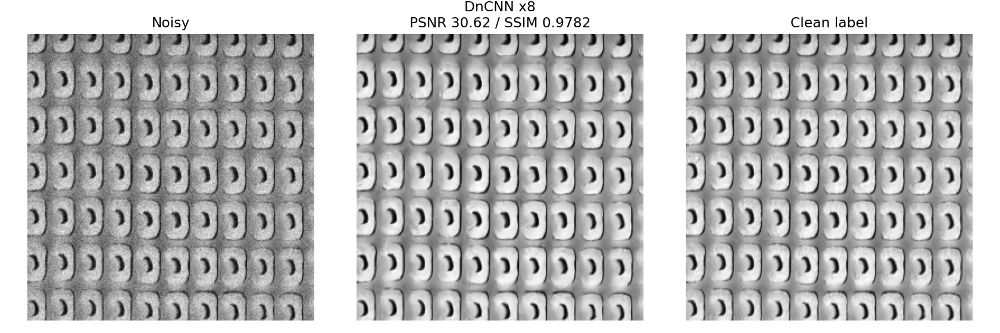

L1_000f9e2e89ff8ffa8e3b9a6ac12bf490.png


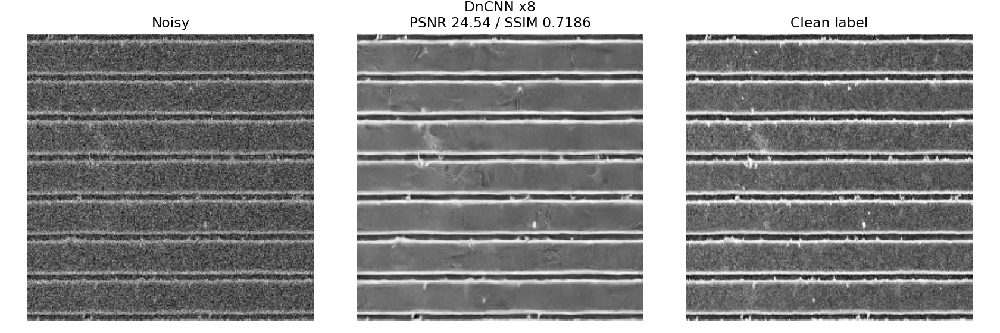

L1_01a9d3f7317bf4905b707e63524d610f.png


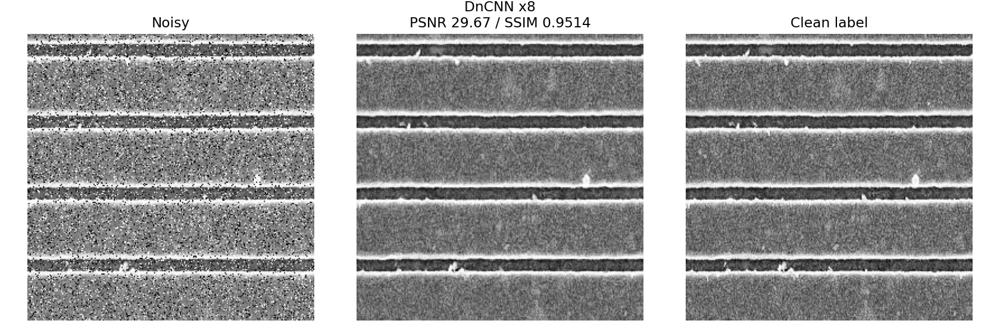

running original test cell 7
running original test cell 8


baseline:   0%|          | 0/100 [00:00<?, ?batch/s]


[PSNR]
noise                 n  Noisy (input)   DnCNN (best)       Mean 3x3     Median 3x3   Adaptive 5x5
--------------------------------------------------------------------------------------------------
gaussian             25         27.668         34.734         26.316         27.382         30.078
rician               25         24.079         31.173         23.669         24.080         27.046
uniform              25         29.631         34.472         26.263         26.779         30.521
salt_and_pepper      25         17.304         41.435         23.196         28.496         21.164
--------------------------------------------------------------------------------------------------
ALL                 100         24.671         35.454         24.861         26.684         27.202

[SSIM]
noise                 n  Noisy (input)   DnCNN (best)       Mean 3x3     Median 3x3   Adaptive 5x5
---------------------------------------------------------------------------------------------

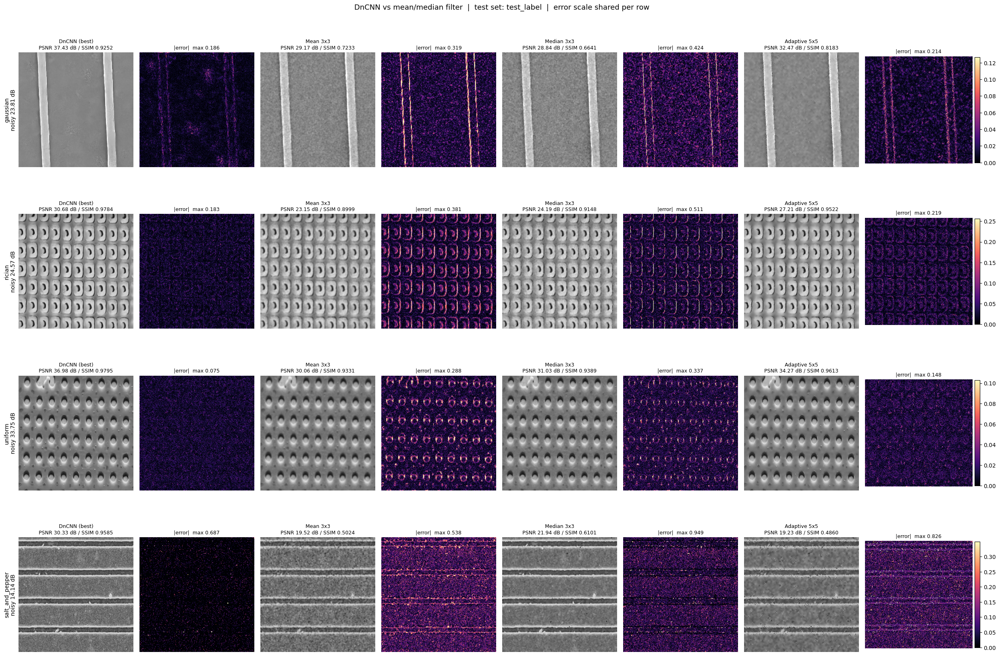

최종 결과 저장: /content/drive/MyDrive/Data scientist/팀프로젝트/5주차/logs_denoising_a100/20260831-073126


In [61]:
TEST_NOTEBOOK = CODE_DIR / "test_denoising.ipynb"
if not TEST_NOTEBOOK.exists():
    raise FileNotFoundError(TEST_NOTEBOOK)

# Optional PNG preview cell(5)은 앞 단계의 임시 파일에 의존하므로 제외합니다.
# 정량 지표와 baseline에 필요한 원본 셀만 같은 namespace에서 실행합니다.
ORIGINAL_TEST_CODE_CELLS = (3, 7, 8, 10)
original_notebook = json.loads(TEST_NOTEBOOK.read_text(encoding="utf-8"))
for cell_index in ORIGINAL_TEST_CODE_CELLS:
    original_cell = original_notebook["cells"][cell_index]
    if original_cell.get("cell_type") != "code":
        raise RuntimeError(f"expected code cell at index {cell_index}")
    source = "".join(original_cell.get("source", []))
    print(f"running original test cell {cell_index}")
    exec(
        compile(source, f"{TEST_NOTEBOOK}:cell_{cell_index}", "exec"),
        globals(),
    )

print("최종 결과 저장:", TEST_RUN_DIR)


## 8. Noise별 대표 이미지 선정

각 noise에서 DnCNN PSNR·SSIM 중앙값에 가장 가까운 샘플을 대표 이미지로 선정합니다.

In [56]:
# noise 종류별로 PSNR·SSIM 중앙값에 가장 가까운 대표 이미지 선정
representative_rows = {}

for noise_type in NOISE_RANGES:
    rows = [
        row
        for row in baseline_rows
        if row["noise_type"] == noise_type
    ]

    if not rows:
        continue

    psnr_values = np.asarray(
        [row["psnr_dncnn"] for row in rows],
        dtype=np.float64,
    )
    ssim_values = np.asarray(
        [row["ssim_dncnn"] for row in rows],
        dtype=np.float64,
    )

    median_psnr = float(np.median(psnr_values))
    median_ssim = float(np.median(ssim_values))

    psnr_mad = float(
        np.median(np.abs(psnr_values - median_psnr))
    )
    ssim_mad = float(
        np.median(np.abs(ssim_values - median_ssim))
    )

    psnr_scale = max(psnr_mad, 1e-6)
    ssim_scale = max(ssim_mad, 1e-6)

    def representative_distance(row):
        psnr_distance = (
            (row["psnr_dncnn"] - median_psnr)
            / psnr_scale
        )
        ssim_distance = (
            (row["ssim_dncnn"] - median_ssim)
            / ssim_scale
        )
        return psnr_distance**2 + ssim_distance**2

    representative_rows[noise_type] = min(
        rows,
        key=representative_distance,
    )


selected_names = {
    row["file"]
    for row in representative_rows.values()
}

# 선택된 4개 이미지만 다시 불러와 DnCNN 결과 생성
representative_samples = {}

test_network.eval()

with torch.inference_mode():
    for data in test_loader:
        names = data[DataKey.Name]

        selected_indices = [
            index
            for index, name in enumerate(names)
            if name in selected_names
        ]

        if not selected_indices:
            continue

        label = data[DataKey.Label][selected_indices].to(
            config.device
        )
        noisy = data[DataKey.Noisy][selected_indices].to(
            config.device
        )
        restored = test_network(noisy)

        for batch_index, original_index in enumerate(
            selected_indices
        ):
            name = names[original_index]

            row = next(
                row
                for row in representative_rows.values()
                if row["file"] == name
            )
            noise_type = row["noise_type"]

            representative_samples[noise_type] = {
                "name": name,
                "metrics": row,
                "noisy": (
                    noisy[batch_index]
                    .detach()
                    .cpu()
                    .numpy()
                    .squeeze()
                ),
                "dncnn": (
                    restored[batch_index]
                    .detach()
                    .cpu()
                    .numpy()
                    .squeeze()
                ),
                "label": (
                    label[batch_index]
                    .detach()
                    .cpu()
                    .numpy()
                    .squeeze()
                ),
            }

        if len(representative_samples) == len(
            representative_rows
        ):
            break


# 기존 시각화 코드가 그대로 사용하도록 교체
noise_samples = representative_samples

print("선택된 대표 이미지")
for noise_type, sample in noise_samples.items():
    metrics = sample["metrics"]
    print(
        f"{noise_type:<18} "
        f"{sample['name']} | "
        f"PSNR {metrics['psnr_dncnn']:.2f} | "
        f"SSIM {metrics['ssim_dncnn']:.4f}"
    )

선택된 대표 이미지
uniform            L1_3bfa0cb6d99c042c43d43242cd54d266.npy | PSNR 33.07 | SSIM 0.9740
gaussian           L1_6312926d73621e53c305dccdc5033fda.npy | PSNR 36.43 | SSIM 0.9607
salt_and_pepper    L1_6ca2a47b6aec6b013e999bc65bdea173.npy | PSNR 42.13 | SSIM 0.9969
rician             L1_7b9d17ba47740facec048c40fa8eedd4.npy | PSNR 32.23 | SSIM 0.9509


## 9. Noisy / DnCNN / Clean / Error 비교

saved: /content/drive/MyDrive/Data scientist/팀프로젝트/5주차/logs_denoising_a100/20260831-073126/dncnn_clean_comparison.png


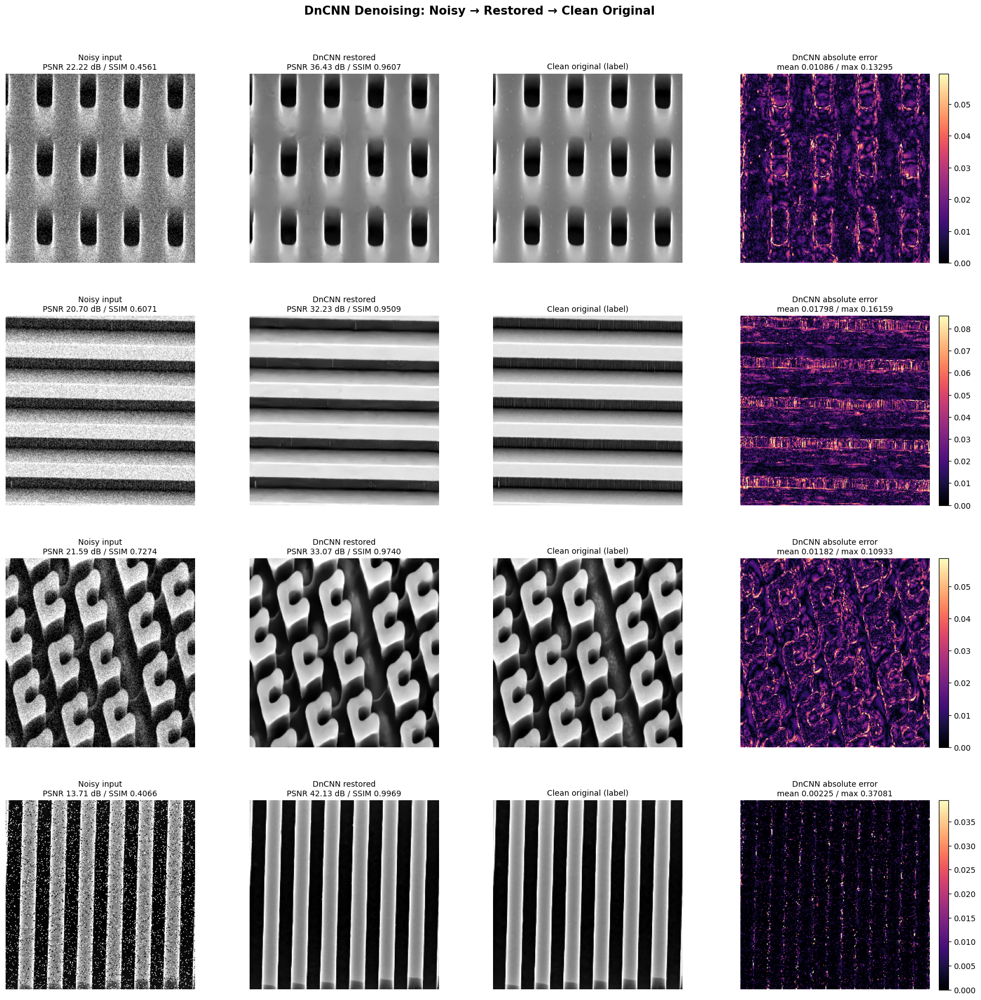

In [57]:
ERROR_CMAP = "magma"

row_order = [
    noise_type
    for noise_type in [*NOISE_RANGES.keys(), "unknown"]
    if noise_type in noise_samples
]

if not row_order:
    raise RuntimeError(
        "noise_samples가 비어 있습니다. baseline 평가 셀을 먼저 실행하세요."
    )

fig, axes = plt.subplots(
    len(row_order),
    4,
    figsize=(18, 4.5 * len(row_order)),
    squeeze=False,
)

for row_index, noise_type in enumerate(row_order):
    sample = noise_samples[noise_type]
    noisy = sample["noisy"]
    restored = sample["dncnn"]
    clean = sample["label"]
    metrics = sample["metrics"]

    display_min = float(np.percentile(clean, 1))
    display_max = float(np.percentile(clean, 99))

    absolute_error = np.abs(restored - clean)
    error_max = float(
        max(np.percentile(absolute_error, 99.5), 1e-6)
    )

    panels = [
        (
            noisy,
            "gray",
            display_min,
            display_max,
            "Noisy input\n"
            f"PSNR {metrics['psnr_noisy']:.2f} dB / "
            f"SSIM {metrics['ssim_noisy']:.4f}",
        ),
        (
            restored,
            "gray",
            display_min,
            display_max,
            "DnCNN restored\n"
            f"PSNR {metrics['psnr_dncnn']:.2f} dB / "
            f"SSIM {metrics['ssim_dncnn']:.4f}",
        ),
        (
            clean,
            "gray",
            display_min,
            display_max,
            "Clean original (label)",
        ),
        (
            absolute_error,
            ERROR_CMAP,
            0.0,
            error_max,
            "DnCNN absolute error\n"
            f"mean {absolute_error.mean():.5f} / "
            f"max {absolute_error.max():.5f}",
        ),
    ]

    for column_index, (
        image,
        color_map,
        value_min,
        value_max,
        title,
    ) in enumerate(panels):
        axis = axes[row_index, column_index]

        rendered = axis.imshow(
            image,
            cmap=color_map,
            vmin=value_min,
            vmax=value_max,
        )
        axis.set_title(title, fontsize=10)
        axis.axis("off")

        if column_index == 0:
            axis.set_ylabel(
                f"{noise_type}\n{sample['name']}",
                fontsize=10,
            )
            axis.yaxis.set_visible(True)
            axis.set_yticks([])

        if column_index == 3:
            fig.colorbar(
                rendered,
                ax=axis,
                fraction=0.046,
                pad=0.04,
            )

fig.suptitle(
    "DnCNN Denoising: Noisy → Restored → Clean Original",
    fontsize=15,
    fontweight="bold",
)

fig.tight_layout(rect=(0, 0, 1, 0.96))
fig.subplots_adjust(hspace=0.28)

comparison_path = (
    TEST_RUN_DIR / "dncnn_clean_comparison.png"
)
fig.savefig(
    comparison_path,
    dpi=180,
    bbox_inches="tight",
)

print("saved:", comparison_path)
plt.show()

## 10. 저장 결과와 운영 규칙

- `checkpoint_best_a100.ckpt`: validation PSNR 기준 최고 모델
- `training_history.json`: epoch별 학습·validation 기록
- `impulse_correction_validation.json`: validation-only ablation 결과
- `baseline_metrics.json`: 최종 test 정량 지표
- `baseline_grid.png`: 기존 필터와 DnCNN 비교
- `dncnn_clean_comparison.png`: 대표 샘플 복원 결과

Test 결과를 학습률, epoch, loss, threshold 선택에 다시 사용하지 않습니다.